In [ ]:
import time
from tqdm.notebook import trange, tqdm
from functools import partial
trange = partial(trange, bar_format="{bar}", leave=False)
tqdm = partial(tqdm, bar_format="{bar}", leave=False)

import jax
import jax.numpy as jnp
from jax import grad, vmap
from jax import random

# Set random seed for reproducibility
_key = jax.random.key(42)

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
%matplotlib inline
# %config InlineBackend.figure_format='svg'
%config InlineBackend.figure_format='retina'
%load_ext vscode_magic
import seaborn as sns

import numpy as np
from scipy.stats import gaussian_kde

The vscode_plot_theme extension is already loaded. To reload it, use:
  %reload_ext vscode_plot_theme


In [234]:
%%html
<style>
.cell-output-ipywidget-background {
   background-color: transparent !important;
}
.jp-OutputArea-output {
   background-color: transparent;
}  
</style>

In [235]:

def plot_svgd_posterior_1d(particles, true_params=None, obs_stats=None, 
                           map=None, 
                           ax=None, title="SVGD Posterior Approximation"):
    """
    Plot 1D posterior approximation from SVGD particles
    
    Args:
        particles: shape (n_particles, 1) array of SVGD particles
        true_params: optional true parameter value for comparison
        title: plot title
    """
    if ax is None:        
        plt.figure(figsize=(8, 6))
        ax = plt.gca()
    
    # Extract 1D values
    x = particles.flatten()
    
    # Plot histogram of particles
    ax.hist(x, bins=30, density=True, alpha=0.4, label='Particle histogram')
    
    # Plot KDE of posterior
    kde = gaussian_kde(x)
    xx = np.linspace(min(x), max(x), 1000)
    ax.plot(xx, kde(xx), color='orange', lw=2, label='KDE posterior')
    
    # Add true parameter if provided
    if true_params is not None:
        ax.axvline(true_params, color='red', linestyle='--', 
                   label=f'True value: {true_params:.2f}')
        

    # Add data statistics
    if obs_stats is not None:
        ax.axvline(obs_stats, color='magenta',
                   label=f'Observed value: {obs_stats:.2f}')    
    if map is not None:
        ax.axvline(map, color='orange', linestyle='dashed',
                   label=f'MAP value: {map:.2f}')       
    
    ax.set_title(title)
    ax.set_xlabel('Parameter value')
    ax.set_ylabel('Density')
    ax.legend()
    sns.despine(ax=ax)
    # plt.grid(alpha=0.3)
    # plt.show()

def plot_svgd_posterior_2d(particles, x_data, true_params=None, obs_stats=None,
                          map=None,
                          figsize=(10, 8),
                          labels=["Parameter 1", "Parameter 2"],
                          title=None):
    """
    Plot 2D posterior approximation from SVGD particles
    
    Args:
        particles: shape (n_particles, 2) array of SVGD particles
        true_params: optional array of true parameter values [p1, p2]
        labels: parameter names for axes
        title: plot title
    """
    plt.figure(figsize=figsize)
    
    # Extract parameters
    x = particles[:, 0]
    y = particles[:, 1]
    
    # Create 2D histogram
    plt.subplot(2, 2, 1)
    plt.hist2d(x, y, bins=30, cmap='viridis')
    plt.colorbar(label='Particle count')
    if true_params is not None:
        plt.plot(true_params[0], true_params[1], ls='', color='red', marker='*', markersize=10, 
                label='True value')        
        # plt.legend()
    if obs_stats is not None:
        plt.plot(obs_stats[0], obs_stats[1], ls='', color='magenta', marker='*', markersize=10, 
            label='Obs value')        
        # plt.legend()
    if map is not None:
        plt.plot(map[0], map[1], ls='', color='orange', marker='*', markersize=10, 
                 label=f'MAP value')
        # plt.legend()

    plt.xlabel(labels[0])
    plt.ylabel(labels[1])
    plt.title('2D Histogram')
    
    # Create scatter plot
    plt.subplot(2, 2, 2)
    plt.scatter(x, y, alpha=0.5, s=1, edgecolor='none')
    if true_params is not None:
        plt.plot(true_params[0], true_params[1], ls='', color='red', marker='*', markersize=10, 
                label='True value')
        # plt.legend()
    if obs_stats is not None:
        plt.plot(obs_stats[0], obs_stats[1], ls='', color='magenta', marker='*', markersize=10, 
            label='Obs value')        
        # plt.legend()
    if map is not None:
        plt.plot(map[0], map[1], ls='', color='orange', marker='*', markersize=10, 
                 label='MAP value')
        # plt.legend()

    plt.xlabel(labels[0])
    plt.ylabel(labels[1])
    plt.title('Particle Distribution')
    
    plt.subplot(2, 2, 3)
    plot_svgd_posterior_1d(
        particles[:, 0:1],  # Select only the first parameter
        true_params=true_params[0],
        obs_stats=x_data.mean(),
        map=map[0] if map is not None else None,
        ax=plt.gca(),
        title="Posterior Distribution of Mean Parameter"
    )

    plt.subplot(2, 2, 4)
    plot_svgd_posterior_1d(
        particles[:, 1:2],  # Select only the second parameter
        true_params=true_params[1],
        obs_stats=x_data.std(),
        map=map[1] if map is not None else None,
        ax=plt.gca(),
        title="Posterior Distribution of Standard Deviation Parameter"
    )

#    plt.legend()

    # Create KDE for each marginal
    
    # kde_x = gaussian_kde(x)
    # xx = np.linspace(min(x), max(x), 1000)
    # plt.plot(xx, kde_x(xx), 'b-', lw=2)
    # if true_params is not None:
    #     plt.axvline(true_params[0], color='r', linestyle='--')
    # plt.xlabel(labels[0])
    # plt.ylabel('Density')
    # plt.title(f'Marginal posterior: {labels[0]}')
    
    # plt.subplot(2, 2, 4)
    # kde_y = gaussian_kde(y)
    # yy = np.linspace(min(y), max(y), 1000)
    # plt.plot(yy, kde_y(yy), 'b-', lw=2)
    # if true_params is not None:
    #     plt.axvline(true_params[1], color='r', linestyle='--')
    # plt.xlabel(labels[1])
    # plt.ylabel('Density')
    # plt.title(f'Marginal posterior: {labels[1]}')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    # plt.show()


def animate_svgd_2d(particle_history, true_params=None, obs_stats=None,
                    map=None,
                    first_params=2, figsize=(5, 5),
                   labels=["Parameter 1", "Parameter 2"],
                   title="SVGD Posterior Evolution"):
    """
    Create an animation of SVGD particle evolution
    
    Args:
        particle_history: list of particle arrays at each iteration
        true_params: optional true parameter values [p1, p2]
        labels: parameter names for axes
        title: animation title
    """
    fig, ax = plt.subplots(figsize=figsize)
    
    # Set up plot
    x_min = min(np.min(p[:, 0]) for p in particle_history)
    x_max = max(np.max(p[:, 0]) for p in particle_history)
    y_min = min(np.min(p[:, 1]) for p in particle_history)
    y_max = max(np.max(p[:, 1]) for p in particle_history)
    
    # Add some padding
    x_pad = 0.1 * (x_max - x_min)
    y_pad = 0.1 * (y_max - y_min)
    
    ax.set_xlim(x_min - x_pad, x_max + x_pad)
    ax.set_ylim(y_min - y_pad, y_max + y_pad)
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])
    ax.set_title(title)
    
    # Plot true parameters if provided
    if true_params is not None:
        ax.plot(true_params[0], true_params[1], ls='', color='red', marker='*', markersize=5, label='True value')
    if obs_stats is not None:
        ax.plot(obs_stats[0], obs_stats[1], ls='', color='magenta', marker='*', markersize=5, label='Observed value')
    if map is not None:
        ax.plot(map[0], map[1], ls='', color='orange', marker='*', markersize=5, label='MAP value')

#    ax.legend()
        
    
    # Initialize scatter plot
    scatter = ax.scatter([], [], alpha=1, s=2, edgecolor='none')
    iteration_text = ax.text(0.02, 0.98, '', transform=ax.transAxes, va='top')
    
    def init():
        scatter.set_offsets(np.empty((0, 2)))
        iteration_text.set_text('')
        return scatter, iteration_text
    
    def update(frame):
        scatter.set_offsets(particle_history[frame])
        scatter.set_offsets(particle_history[frame][:, :first_params])  # Just first two parameters

        iteration_text.set_text(f'Iteration: {frame}')
        return scatter, iteration_text
    
    anim = FuncAnimation(fig, update, frames=len(particle_history),
                         init_func=init, blit=True, interval=100)
    
    plt.close()  # Prevent duplicate display in notebooks
    return anim


def check_convergence(particle_history, log_p_fn, x_data):
    """Monitor convergence of SVGD by tracking statistics"""
    mean_params = []
    std_params = []
    log_probs = []
    
    for particles in particle_history:
        # Track parameter statistics
        mean_params.append(np.mean(particles, axis=0))
        std_params.append(np.std(particles, axis=0))
        
        # Track average log probability
        avg_log_p = np.mean([log_p_fn(p, x_data) for p in particles])
        log_probs.append(avg_log_p)
    
    # Plot convergence metrics
    fig, axes = plt.subplots(1, 3, figsize=(10, 3))
    
    # Plot mean parameters
    axes[0].plot([p[0] for p in mean_params], label='Mean (μ)')
    axes[0].plot([p[1] for p in mean_params], label='Std Dev (σ)')
    axes[0].set_title('Parameter Means')
    axes[0].set_xlabel('Iteration')
    axes[0].set_ylabel('Value')
    axes[0].legend()
    
    # Plot parameter standard deviations
    axes[1].plot([p[0] for p in std_params], label='Std of μ')
    axes[1].plot([p[1] for p in std_params], label='Std of σ')
    axes[1].set_title('Parameter Standard Deviations')
    axes[1].set_xlabel('Iteration')
    axes[1].set_ylabel('Value')
    axes[1].legend()
    
    # Plot log probabilities
    axes[2].plot(log_probs)
    axes[2].set_title('Average Log Probability')
    axes[2].set_xlabel('Iteration')
    axes[2].set_ylabel('Log Prob')
    
    plt.tight_layout()


### Dummy data

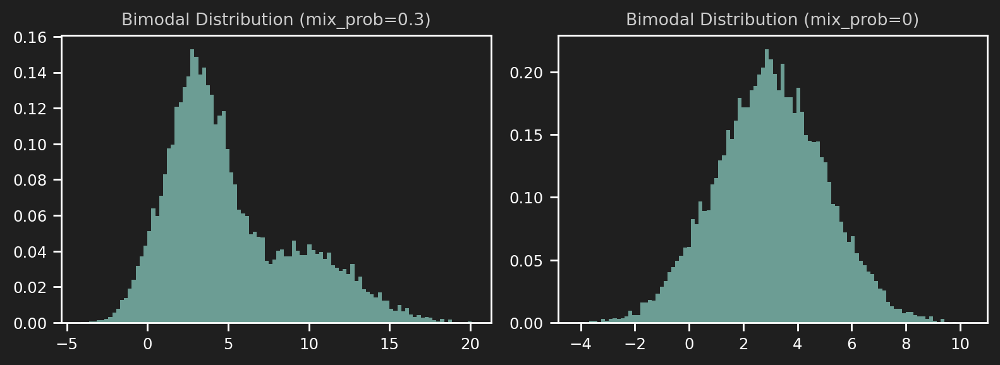

In [236]:
def sample_bimodal(key, n_samples, mu1=3.0, mu2=10.0, sigma1=2.0, sigma2=3.0, mix_prob=0.3):
    """
    Sample from a bimodal distribution (mixture of two Gaussians)
    
    Args:
        key: JAX PRNGKey
        n_samples: Number of samples to generate
        mu1, mu2: Means of the two Gaussians
        sigma1, sigma2: Standard deviations of the two Gaussians
        mix_prob: Probability of sampling from the first Gaussian
        
    Returns:
        Array of samples from the bimodal distribution
    """
    # Split the key for multiple random operations
    key1, key2, key3 = random.split(key, 3)
    
    # Generate random component assignments (0 or 1)
    component = random.bernoulli(key1, p=1-float(mix_prob), shape=(n_samples,))
    
    # Sample from each Gaussian
    samples1 = random.normal(key2, shape=(n_samples,)) * sigma1 + mu1
    samples2 = random.normal(key3, shape=(n_samples,)) * sigma2 + mu2
    
    # Select samples based on component assignment
    samples = jnp.where(component, samples1, samples2)
    
    return samples

# Example usage
_rkey = random.key(42)
fig, ax = plt.subplots(1, 2, figsize=(8, 3))


# For visualization (requires matplotlib)
import matplotlib.pyplot as plt

ax[0].hist(sample_bimodal(_rkey, n_samples=10000, mix_prob=0.3), 
         bins=100, density=True, alpha=0.7)
ax[0].set_title("Bimodal Distribution (mix_prob=0.3)")
ax[1].hist(sample_bimodal(_rkey, n_samples=10000, mix_prob=0), 
         bins=100, density=True, alpha=0.7)
ax[1].set_title("Bimodal Distribution (mix_prob=0)")
plt.tight_layout()


## PDF based inference

In [ ]:
# Use adaptive kernel bandwidth
# def median_heuristic(particles, beta=0.5):
#     """Compute bandwidth using median heuristic"""
#     n = particles.shape[0]
#     pairwise_dists = jnp.zeros((n, n))
    
#     for i in range(n):
#         for j in range(n):
#             pairwise_dists = pairwise_dists.at[i, j].set(
#                 jnp.sum((particles[i] - particles[j])**2))
    
#     # Get median of non-zero distances
#     h = jnp.median(pairwise_dists[pairwise_dists > 0])
#     return beta * h


# Use more robust step size scheduling
@jax.jit
def step_size_schedule(i, total_iter, initial=0.05, final=0.001):
    """Cosine annealing schedule for step size"""
    return final + 0.5 * (initial - final) * (1 + jnp.cos(jnp.pi * i / total_iter))

# Use mini-batching for large datasets
@jax.jit
def log_pdf_minibatch(theta, x_data, batch_size=100):
    """Compute log pdf using a random subset of data"""
    idx = jax.random.choice(
        jax.random.key(int(time.time())), 
        jnp.arange(len(x_data)), 
        shape=(batch_size,), 
        replace=False
    )
    x_batch = x_data[idx]
    # Scale the log probability to account for the full dataset
    return (len(x_data) / batch_size) * log_pdf(theta, x_batch)

# # Add numerical stability to log_pdf calculations
# def stable_log_pdf(theta, x):

#     # # Add constraints to prevent invalid parameters
#     # sigma = max(sigma, 1e-6)  # Prevent too small standard deviation

#     # Compute log-pdf with numerical safeguards
#     log_probs = -0.5 * ((x - theta[0]) / theta[1])**2 - jnp.log(theta[1]) - 0.5 * jnp.log(2 * jnp.pi)

#     # # Clip extreme values to prevent numerical issues
#     # log_probs = np.clip(log_probs, -100, 100)

#     # Use logsumexp for numerical stability
#     return jax.scipy.special.logsumexp(log_probs)

# Target log-pdf (up to constant), e.g., standard normal
@jax.jit
def log_pdf(theta, x):
    # Assume numeric PDF provided, here as a toy example
    # return jnp.sum(jnp.log(jnp.exp(-0.5 * ((x - theta[0]) / theta[1])**2) / (theta[1] * jnp.sqrt(2 * jnp.pi))))

    exponent = -0.5 * ((x - theta[0]) / theta[1])**2
    
    # Constant term (log of normalization factor)
    log_normalizer = -jnp.log(theta[1]) - 0.5 * jnp.log(2 * jnp.pi)
    
    # Combine terms for each data point
    log_probs = exponent + log_normalizer
    
    # Use jnp instead of np for all operations
    return jnp.sum(log_probs)

# Score function: ∂/∂θ log f(x | θ)
score = grad(log_pdf, argnums=0)

# RBF kernel and its gradient
@jax.jit
def rbf_kernel(x, y, h=1.0):
    sq_dist = jnp.sum((x - y)**2)
    return jnp.exp(-sq_dist / (2 * h))

@jax.jit
def adaptive_rbf_kernel(x, y, h_x, h_y):
    """RBF kernel with particle-specific bandwidths"""
    # Use the average of the two bandwidths
    h_avg = 0.5 * (h_x + h_y)
    return jnp.exp(-jnp.sum((x - y)**2) / (2 * h_avg))

@jax.jit
def grad_k(x, y, h=1.0):
    # Calculate gradient of k(x,y) with respect to x
    return grad(lambda x: rbf_kernel(x, y, h))(x)


# Use adaptive kernel bandwidth
@jax.jit
def median_heuristic(particles):
    """Compute bandwidth using median heuristic"""
    pairwise_dist = jnp.sum((particles[:, None, :] - particles[None, :, :])**2, axis=-1)
    h = jnp.median(pairwise_dist) / (2 * jnp.log(particles.shape[0] + 1))
    return h

# Local bandwidth adjustment: For highly multimodal distributions, consider
# using particle-specific bandwidths that adapt to local density:
@jax.jit
def local_adaptive_bandwidth(particles, k=5):
    """Compute local bandwidth for each particle based on k nearest neighbors"""
    # Compute pairwise distances
    pairwise_dist = jnp.sum((particles[:, None, :] - particles[None, :, :])**2, axis=-1)
    
    # For each particle, find distance to k-th nearest neighbor
    sorted_dist = jnp.sort(pairwise_dist, axis=1)
    kth_neighbor_dist = sorted_dist[:, k]

    # Set bandwidth proportional to distance to k-th neighbor
    local_h = kth_neighbor_dist / (2 * jnp.log(k + 1))
    return local_h

# Batch-based bandwidth estimation: For very large datasets, compute the
# bandwidth using a random subset of the data to improve computational
# efficiency:
@jax.jit
def batch_median_heuristic(particles, max_particles=1000):
    """Compute bandwidth using a subset of particles for large sample sizes"""
    if len(particles) > max_particles:
        idx = np.random.choice(len(particles), max_particles, replace=False)
        particles_subset = particles[idx]
    else:
        particles_subset = particles
        
    pairwise_dist = jnp.sum((particles_subset[:, None, :] - particles_subset[None, :, :])**2, axis=-1)
    h = jnp.median(pairwise_dist) / (2 * jnp.log(max_particles + 1))
    return h


def svgd_update_with_adaptive_bandwidth_vectorized(particles, grad_log_prob, neighbors, step_size):
    """
    Vectorized implementation of SVGD with adaptive bandwidth
    
    Args:
        particles: array of shape (n_particles, dim)
        grad_log_prob: function that computes gradient of log probability
        step_size: learning rate for the update
        
    Returns:
        Updated particles after one SVGD step
    """
    
    ### h
    # Compute local bandwidths for each particle
    local_bandwidths = local_adaptive_bandwidth(particles, k=neighbors)

    # Compute gradients of log probability for all particles
    log_prob_grads = jax.vmap(grad_log_prob)(particles)
    
    # Number of particles
    n_particles = particles.shape[0]
    
    # Compute pairwise differences between particles: (n_particles, n_particles, dim)
    pairwise_diff = particles[:, None, :] - particles[None, :, :]
    
    # Compute pairwise squared distances: (n_particles, n_particles)
    pairwise_dist_sq = jnp.sum(pairwise_diff**2, axis=-1)
    
    # Compute average bandwidths between all pairs: (n_particles, n_particles)
    h_matrix = 0.5 * (local_bandwidths[:, None] + local_bandwidths[None, :])


    ### grad_K
    # Compute kernel matrix: (n_particles, n_particles)
    kernel_matrix = jnp.exp(-0.5 * pairwise_dist_sq / h_matrix)
    
    
    ### grad_K
    # Compute kernel-weighted average of gradients (kernel term)
    # (n_particles, n_particles, 1) * (n_particles, 1, dim) -> (n_particles, n_particles, dim)
    kernel_term = kernel_matrix[:, :, None] * log_prob_grads[None, :, :]
    
    # Sum over particles j: (n_particles, dim)
    kernel_term_sum = jnp.sum(kernel_term, axis=1) / n_particles
    
    # Compute gradient of kernel w.r.t. particles (repulsive term)
    # (n_particles, n_particles, 1) * (n_particles, n_particles, dim) / (n_particles, n_particles, 1)
    grad_kernel = kernel_matrix[:, :, None] * pairwise_diff / h_matrix[:, :, None]
    


    # Sum over particles j: (n_particles, dim)
    repulsive_term_sum = jnp.sum(grad_kernel, axis=1) / n_particles
    
    # Combine terms for the SVGD update
    phi = kernel_term_sum + repulsive_term_sum
    
    # Update particles
    updated_particles = particles + step_size * phi
    
    return updated_particles

# SVGD update for a set of particles
def svgd_update(particles, score_fn, step_size=0.1, h=None, bw_scaling=None, grad_clip=None):

    n = particles.shape[0]
    
    # Compute scores for all particles
    scores = vmap(score_fn)(particles)

    # Initialize the SVGD update vector
    phi = jnp.zeros_like(particles)

    if h is None:
        # Adaptive bandwidth using median heuristic
        h = median_heuristic(particles) * bw_scaling

    # Compute the kernel matrix and its gradients
    @jax.jit
    def kernel_and_grad(i):
        # Compute k(x_i, x_j) for all j
        k_ij = vmap(lambda j: rbf_kernel(particles[i], particles[j], h))(jnp.arange(n))
        
        # Compute ∇_x k(x_j, x_i) for all j
        grad_k_ij = vmap(lambda j: grad_k(particles[j], particles[i], h))(jnp.arange(n))
        
        # Compute the SVGD direction
        return jnp.mean(k_ij[:, None] * scores + grad_k_ij, axis=0)

    # Compute phi for each particle
    phi = vmap(kernel_and_grad)(jnp.arange(n))
    
    if grad_clip is not None:
        # Apply gradient clipping for stability
        max_norm = grad_clip
        phi_norm = jnp.sqrt(jnp.sum(phi**2, axis=1, keepdims=True))
        scale = jnp.minimum(1.0, max_norm / (phi_norm + 1e-8))
        phi = phi * scale

    # Update particles
    new_particles = particles + step_size * phi

    # Optional: Add constraints to parameters
    # e.g., enforce positive standard deviation
    new_particles = new_particles.at[:, 1].set(jnp.maximum(new_particles[:, 1], 1e-5))

    return new_particles

@jax.jit
def annealing(iteration, max_iterations, h_start, h_end):
    """Decrease bandwidth from h_start to h_end over iterations"""
    t = jnp.min(iteration / max_iterations, 1.0)
    return h_start * (1 - t) + h_end * t



key = jax.random.key(int(time.time()))
# key = jax.random.key(42)


n_samples = 1000
nr_particles = 300  # Number of particles
nr_iterations = 500
batch_size = 100
bw = 'median'  
# bw = 'adaptive'  
# bw = 0.1  # Fixed bandwidth for testing
neighbors = 30

#key = jax.random.key(0)
mu = 3.0
sigma = 2.0
x_data = sample_bimodal(key, n_samples=n_samples, 
                        mu1=mu, mu2=10.0, 
                        sigma1=sigma, sigma2=3.0, 
                        mix_prob=0.0)
#x_data = x_data[(x_data > -10) & (x_data < 10)]  # Filter to keep within bounds


particles = jax.random.uniform(key, shape=(nr_particles, 2), minval=jnp.array([-1.0, 0.5]), maxval=jnp.array([1.0, 2.0]))

particle_history = []
particle_history.append(np.array(particles))  # Initial particles    
for i in trange(nr_iterations):

    if batch_size is not None and x_data is not None and len(x_data) > batch_size:
        idx = jax.random.choice(
            jax.random.key(int(time.time())), 
            jnp.arange(len(x_data)), 
            shape=(batch_size,), 
            replace=False
        )
        x_batch = x_data[idx]
        score_fn = grad(lambda theta: log_pdf(theta, x_batch))
    else:
        score_fn = grad(lambda theta: log_pdf(theta, x_data) if x_data is not None else log_pdf(theta))

    step_size = step_size_schedule(i, nr_iterations, initial=0.01, final=0.001)

    bw_scaling = 1 # annealing(i, nr_iterations, 100, 1)

    if bw == 'median':
        particles = svgd_update(
            particles, 
            score_fn, 
            step_size=step_size,
            bw_scaling=bw_scaling,
            # h=x_data.shape[0]**(-1/(4+particles.shape[1])) ** i, # Adaptive bandwidth scaling
            grad_clip=2,
            # batch_size=200,
        )
    elif bw == 'adaptive':
        particles = svgd_update_with_adaptive_bandwidth_vectorized(
            particles, score_fn, neighbors=neighbors, step_size=step_size)
    else:
        # Fixed bandwidth
        particles = svgd_update(particles, score_fn, h=bw, step_size=step_size)

    every = 10
    if i % every == 0:  # Save every 5 iterations to reduce file size
        particle_history.append(np.array(particles))
            
    # # Print diagnostics every 20 steps
    # if i % (nr_iterations // 5) == 0:

    #     print(f"Step {i}: Mean θ₁={particles[:, 0].mean():.4f}, Mean θ₂={particles[:, 1].mean():.4f}")

In [238]:
def get_map_estimate(particles, x_data, log_prob_func):
    log_probs = jnp.array([log_prob_func(p, x_data) for p in particles])
    map_idx = jnp.argmax(log_probs)
    return particles[map_idx], log_probs[map_idx]

map, loglike = get_map_estimate(particles, x_data, log_pdf)
map, loglike

(Array([2.872325 , 2.0189972], dtype=float32),
 Array(-2121.6746, dtype=float32))

In [239]:
def refine_map_estimate(particles, x_data, log_prob_func, n_steps=100, step_size=0.001):
    # Find best particle as starting point
    map_particle, _ = get_map_estimate(particles, x_data, log_prob_func)
    
    score_fn = grad(lambda theta: log_pdf(theta, x_data) if x_data is not None else log_pdf(theta))

    # Perform gradient ascent to find mode
    x = map_particle
    prev = x
    for i in range(n_steps):
        x = x + step_size * score_fn(x)
        if jnp.abs(prev - x).max() < 1e-6:
            break
        prev = x
    return x

ref_map = refine_map_estimate(particles, x_data, log_pdf, n_steps=100, step_size=0.001)
ref_map - map

Array([-0.00279832,  0.00027013], dtype=float32)

In [240]:
ref_map, x_data.mean(), x_data.std()

(Array([2.8695266, 2.0192673], dtype=float32),
 Array(2.869524, dtype=float32),
 Array(2.0192676, dtype=float32))

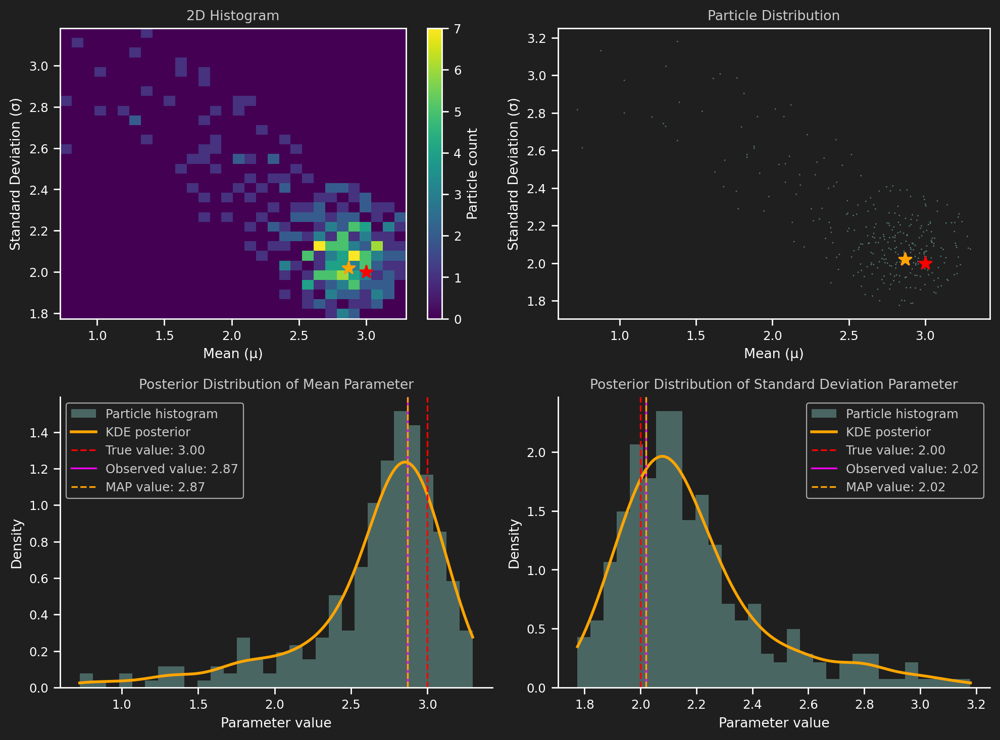

In [241]:
sns.set_context('paper')
# Plot the final posterior approximation
plot_svgd_posterior_2d(
    np.array(particles),  # Convert to numpy if using JAX arrays
    x_data,
    true_params=[mu, sigma],  # True parameters that generated the data
    obs_stats=[x_data.mean(), x_data.std()],
    map=ref_map,
    labels=["Mean (μ)", "Standard Deviation (σ)"],
)


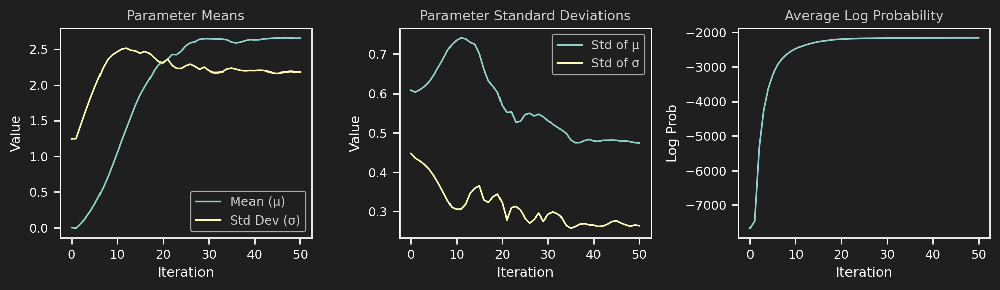

In [242]:
check_convergence(particle_history, log_pdf, x_data)

In [243]:
plt.rcParams['animation.embed_limit'] = 100 # Mb

# Create and save animation (skip first couple frames to shrink plotted range)
anim = animate_svgd_2d(particle_history,
                      true_params=[0.0, 1.0],
                      obs_stats=[x_data.mean(), x_data.std()],  
                      )

anim.save('svgd_evolution.gif', writer='pillow', fps=10)
# anim.save('svgd_evolution.mp4', writer='ffmpeg', fps=10)

from IPython.display import HTML
HTML(anim.to_jshtml())

In [272]:
def compute_hdi(samples, mass=0.95):
    """
    Compute the Highest Density Interval from a set of samples
    
    Args:
        samples: Array of samples for a single parameter
        mass: The probability mass to include (default: 0.95 for 95% HDI)
        
    Returns:
        The lower and upper bounds of the HDI
    """
    sorted_samples = jnp.sort(samples)
    n = len(sorted_samples)
    interval_idx_count = int(jnp.floor(mass * n))
    
    if interval_idx_count < 2:
        return sorted_samples[0], sorted_samples[-1]
    
    # Initialize with widest interval
    min_interval_width = float('inf')
    min_interval_start = 0
    
    # Find narrowest interval containing the specified mass
    for i in range(n - interval_idx_count):
        interval_width = sorted_samples[i + interval_idx_count - 1] - sorted_samples[i]
        if interval_width < min_interval_width:
            min_interval_width = interval_width
            min_interval_start = i
    
    hdi_min = sorted_samples[min_interval_start]
    hdi_max = sorted_samples[min_interval_start + interval_idx_count - 1]
    
    return hdi_min, hdi_max


def compute_multivariate_hdr(particles, x_data, log_prob_func, prob_mass=0.95, resolution=500):
    """
    Compute high density region (HDR) for 2D particles
    
    Args:
        particles: Array of shape (n_particles, 2)
        log_prob_func: Function that returns log probability
        prob_mass: Probability mass to include in HDR (default: 0.95)
        resolution: Grid resolution for HDR computation
        
    Returns:
        Boolean mask indicating points in HDR, along with grid coordinates
    """
    # log_prob_func = grad(lambda theta: log_pdf(theta, x_data) if x_data is not None else log_pdf(theta))

    # This function only works for 2D particles
    if particles.shape[1] != 2:
        raise ValueError("HDR computation only implemented for 2D distributions")
    
    # Create a grid over the region
    x_min, x_max = particles[:, 0].min(), particles[:, 0].max()
    y_min, y_max = particles[:, 1].min(), particles[:, 1].max()
    
    # Add some padding
    pad_x = (x_max - x_min) * 0.1
    pad_y = (y_max - y_min) * 0.1
    x_min, x_max = x_min - pad_x, x_max + pad_x
    y_min, y_max = y_min - pad_y, y_max + pad_y
    
    # Create grid
    x = np.linspace(x_min, x_max, resolution)
    y = np.linspace(y_min, y_max, resolution)
    X, Y = np.meshgrid(x, y)
    
    # Check and print shapes for debugging
    print(f"X shape: {X.shape}, Y shape: {Y.shape}")
    
    # Get all grid points as a 2D array of shape (resolution*resolution, 2)
    grid_points = np.column_stack((X.ravel(), Y.ravel()))
    print(f"grid_points shape: {grid_points.shape}")
    
    # Compute log probability at each grid point
    log_probs = np.array([log_prob_func(point, x_data) for point in grid_points])
    print(f"log_probs shape: {log_probs.shape}")
    
    # Convert to probabilities (unnormalized)
    # Subtract max for numerical stability
    log_probs_max = np.max(log_probs)
    probs = np.exp(log_probs - log_probs_max)
    print(f"probs shape: {probs.shape}")
    
    # Sort probabilities to find threshold
    sorted_probs = np.sort(probs)[::-1]  # Descending order
    cumulative_probs = np.cumsum(sorted_probs) / np.sum(sorted_probs)
    threshold_idx = np.searchsorted(cumulative_probs, prob_mass)
    if threshold_idx < len(sorted_probs):
        threshold = sorted_probs[threshold_idx]
    else:
        threshold = sorted_probs[-1]
    
    # Create mask for HDR
    # hdr_mask = jnp.all(probs - threshold >= 0, axis=1)
    hdr_mask = probs >= threshold
    print(f"hdr_mask shape: {hdr_mask.shape}, X.shape: {X.shape}")

    # # Ensure mask has the correct size before reshaping
    # if hdr_mask.size != X.size:
    #     raise ValueError(f"Cannot reshape hdr_mask of size {hdr_mask.size} to match X with size {X.size}")
    
    # Reshape to match the grid
    hdr_mask_grid = hdr_mask.reshape(X.shape)
    
    return hdr_mask_grid, X, Y

def visualize_map_and_hdi(particles, x_data, log_prob_func, dim_names=None):
    """
    Visualize particles with MAP estimate and HDI/HDR
    
    Args:
        particles: Array of shape (n_particles, dim)
        log_prob_func: Function that returns log probability
        dim_names: Optional list of dimension names
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib.patches import Ellipse
    
    dim = particles.shape[1]
    map_estimate, _ = get_map_estimate(particles, x_data, log_prob_func)
    
    if dim_names is None:
        dim_names = [f"Dimension {i+1}" for i in range(dim)]
    
    if dim == 1:
        # 1D case
        plt.figure(figsize=(10, 6))
        plt.hist(particles.flatten(), bins=30, density=True, alpha=0.6)
        
        # Add MAP estimate
        plt.axvline(map_estimate[0], color='r', linestyle='--', 
                   label=f'MAP: {map_estimate[0]:.4f}')
        
        # Compute and add HDI
        hdi_min, hdi_max = compute_hdi(particles.flatten())
        plt.axvline(hdi_min, color='g', linestyle='-', alpha=0.5)
        plt.axvline(hdi_max, color='g', linestyle='-', alpha=0.5)
        plt.axvspan(hdi_min, hdi_max, alpha=0.2, color='orange', 
                   label=f'95% HDI: [{hdi_min:.4f}, {hdi_max:.4f}]')
        
        plt.xlabel(dim_names[0])
        plt.ylabel('Density')
        plt.legend()
        plt.title(f'Particle Distribution with MAP and HDI')
        
    elif dim == 2:
        # 2D case
        plt.figure(figsize=(10, 8))
        
        # Plot particles
        plt.scatter(particles[:, 0], particles[:, 1], alpha=0.5, label='Particles', edgecolor='none')
        
        # Plot MAP estimate
        plt.scatter(map_estimate[0], map_estimate[1], color='r', s=100, marker='*',
                  label=f'MAP')
        
        # Compute and plot HDR
        hdr_mask, X, Y = compute_multivariate_hdr(particles, x_data, log_prob_func)
        plt.contour(X, Y, hdr_mask.astype(int), levels=[0.5], colors='orange', 
                   linewidths=2, 
                #    label='95% HDR'
                   )
        
        plt.xlabel(dim_names[0])
        plt.ylabel(dim_names[1])
        plt.legend()
        plt.title('Particle Distribution with MAP and HDR')
        
    else:
        # For higher dimensions, show pairwise plots
        n_plots = min(6, dim)  # Limit to 6 dimensions for visualization
        fig, axes = plt.subplots(n_plots, n_plots, figsize=(15, 15))
        
        for i in range(n_plots):
            for j in range(n_plots):
                ax = axes[i, j]
                
                if i == j:
                    # Diagonal: show histogram and HDI for this dimension
                    ax.hist(particles[:, i], bins=20, density=True, alpha=0.6)
                    hdi_min, hdi_max = compute_hdi(particles[:, i])
                    ax.axvline(map_estimate[i], color='r', linestyle='--')
                    ax.axvspan(hdi_min, hdi_max, alpha=0.2, color='orange')
                    ax.set_xlabel(dim_names[i])
                    if j == 0:
                        ax.set_ylabel('Density')
                elif i < j:
                    # Upper triangle: leave empty
                    ax.axis('off')
                else:
                    # Lower triangle: scatter plot between dimensions
                    ax.scatter(particles[:, j], particles[:, i], alpha=0.3, s=10)
                    ax.scatter(map_estimate[j], map_estimate[i], color='r', 
                              s=50, marker='*')
                    ax.set_xlabel(dim_names[j])
                    if j == 0:
                        ax.set_ylabel(dim_names[i])
        
        plt.tight_layout()
        plt.suptitle('Pairwise Distributions with MAP Estimates', y=1.02, fontsize=16)
    
    plt.show()


In [273]:
upper, lower = compute_hdi(particles[:, 0], mass=0.95)
float(upper), float(lower)

(1.6233959197998047, 3.281960964202881)

In [274]:
#compute_multivariate_hdr(particles, x_data, log_pdf, prob_mass=0.95, resolution=7)


X shape: (500, 500), Y shape: (500, 500)
grid_points shape: (250000, 2)
log_probs shape: (250000,)
probs shape: (250000,)
hdr_mask shape: (250000,), X.shape: (500, 500)


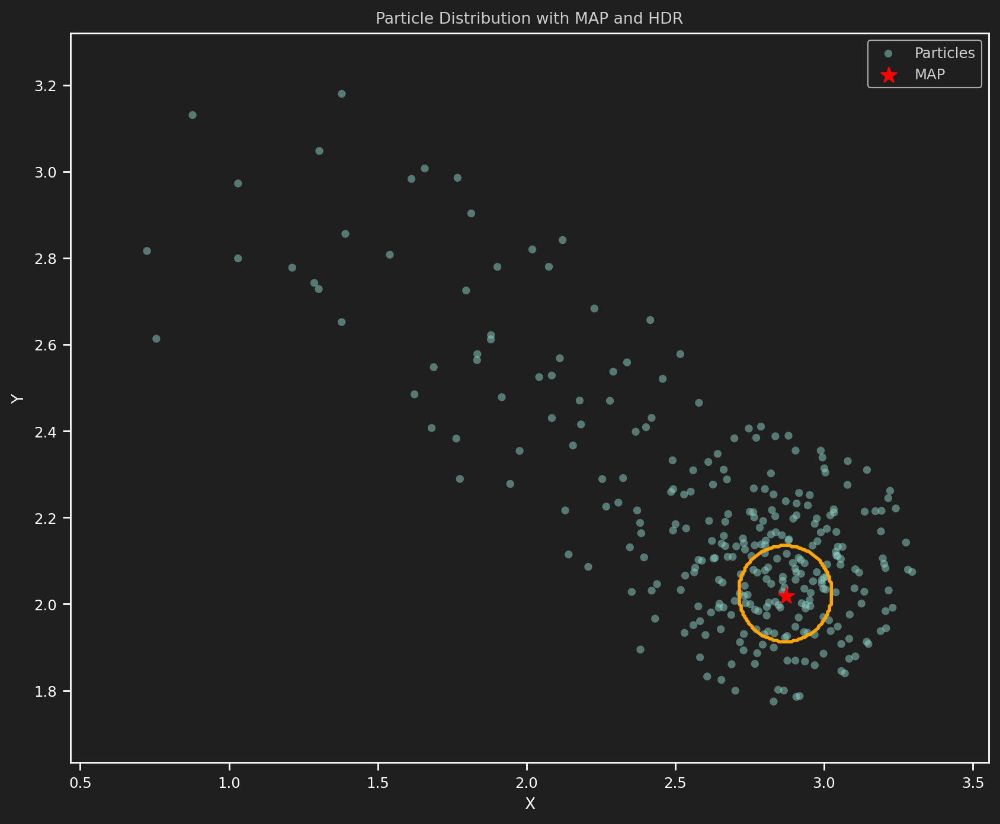

In [275]:
visualize_map_and_hdi(particles, x_data, log_pdf, dim_names=["X", "Y"])

In [203]:
# # Use adaptive kernel bandwidth
# def median_heuristic(particles, beta=0.5):
#     """Compute bandwidth using median heuristic"""
#     n = particles.shape[0]
#     pairwise_dists = jnp.zeros((n, n))
    
#     for i in range(n):
#         for j in range(n):
#             pairwise_dists = pairwise_dists.at[i, j].set(
#                 jnp.sum((particles[i] - particles[j])**2))
    
#     # Get median of non-zero distances
#     h = jnp.median(pairwise_dists[pairwise_dists > 0])
#     return beta * h

# # Use more robust step size scheduling
# def step_size_schedule(i, total_iter, initial=0.05, final=0.001):
#     """Cosine annealing schedule for step size"""
#     return final + 0.5 * (initial - final) * (1 + jnp.cos(jnp.pi * i / total_iter))

# # Use mini-batching for large datasets
# def log_pdf_minibatch(theta, x_data, batch_size=100):
#     """Compute log pdf using a random subset of data"""
#     idx = jax.random.choice(
#         jax.random.key(int(time.time())), 
#         jnp.arange(len(x_data)), 
#         shape=(batch_size,), 
#         replace=False
#     )
#     x_batch = x_data[idx]
#     # Scale the log probability to account for the full dataset
#     return (len(x_data) / batch_size) * log_pdf(theta, x_batch)

# # Add numerical stability to log_pdf calculations
# def stable_log_pdf(theta, x):
#     # Compute log-pdf with numerical safeguards
#     log_probs = -0.5 * ((x - theta[0]) / theta[1])**2 - jnp.log(theta[1]) - 0.5 * jnp.log(2 * jnp.pi)
#     # Use logsumexp for numerical stability
#     return jax.scipy.special.logsumexp(log_probs)

# # Target log-pdf (up to constant), e.g., standard normal
# def log_pdf(theta, x):
#     # Assume numeric PDF provided, here as a toy example
#     return jnp.sum(jnp.log(jnp.exp(-0.5 * ((x - theta[0]) / theta[1])**2) / (theta[1] * jnp.sqrt(2 * jnp.pi))))

# # Score function: ∂/∂θ log f(x | θ)
# score = grad(log_pdf, argnums=0)

# # RBF kernel and its gradient
# def rbf_kernel(x, y, h=1.0):
#     sq_dist = jnp.sum((x - y)**2)
#     return jnp.exp(-sq_dist / (2 * h))

# def grad_k(x, y, h=1.0):
#     # Calculate gradient of k(x,y) with respect to x
#     return grad(lambda x: rbf_kernel(x, y, h))(x)

# def stable_svgd_update(particles, log_p_fn, step_size=0.1, h=None, beta=None, x_data=None, batch_size=None, grad_clip=True):
#     n = particles.shape[0]
    
#     # Use mini-batching if data is large
#     if batch_size is not None and x_data is not None and len(x_data) > batch_size:
#         idx = jax.random.choice(
#             jax.random.key(int(time.time())), 
#             jnp.arange(len(x_data)), 
#             shape=(batch_size,), 
#             replace=False
#         )
#         x_batch = x_data[idx]
#         score_fn = grad(lambda theta: log_p_fn(theta, x_batch))
#     else:
#         score_fn = grad(lambda theta: log_p_fn(theta, x_data) if x_data is not None else log_p_fn(theta))
#     # Compute scores for all particles
#     scores = vmap(score_fn)(particles)
    
#     if h is None:
#         assert beta is not None, "If h is None, beta must be provided for median heuristic."
#         # Adaptive bandwidth using median heuristic
#         h = median_heuristic(particles, beta=beta)
    
#     # Rest of the SVGD implementation remains the same...
#     phi = jnp.zeros_like(particles)
    
#     def kernel_and_grad(i):
#         k_ij = vmap(lambda j: rbf_kernel(particles[i], particles[j], h))(jnp.arange(n))
#         grad_k_ij = vmap(lambda j: grad_k(particles[j], particles[i], h))(jnp.arange(n))
#         return jnp.mean(k_ij[:, None] * scores + grad_k_ij, axis=0)
    

#     phi = vmap(kernel_and_grad)(jnp.arange(n))
    
#     if grad_clip:
#         # Apply gradient clipping for stability
#         max_norm = 10.0
#         phi_norm = jnp.sqrt(jnp.sum(phi**2, axis=1, keepdims=True))
#         scale = jnp.minimum(1.0, max_norm / (phi_norm + 1e-8))
#         phi = phi * scale
    
#     # Update particles
#     new_particles = particles + step_size * phi
    
#     # Optional: Add constraints to parameters
#     # e.g., enforce positive standard deviation
#     new_particles = new_particles.at[:, 1].set(jnp.maximum(new_particles[:, 1], 1e-5))
    
#     return new_particles

# # SVGD update for a set of particles
# def svgd_update(particles, log_p_fn, step_size=0.1, h=1.0, x_data=None):
#     n = particles.shape[0]
    
#     # Define score function based on log_p_fn
#     score_fn = grad(lambda theta: log_p_fn(theta, x_data) if x_data is not None else log_p_fn(theta))
    
#     # Compute scores for all particles
#     scores = vmap(score_fn)(particles)
    
#     # Initialize the SVGD update vector
#     phi = jnp.zeros_like(particles)
    
#     # Compute the kernel matrix and its gradients
#     def kernel_and_grad(i):
#         # Compute k(x_i, x_j) for all j
#         k_ij = vmap(lambda j: rbf_kernel(particles[i], particles[j], h))(jnp.arange(n))
        
#         # Compute ∇_x k(x_j, x_i) for all j
#         grad_k_ij = vmap(lambda j: grad_k(particles[j], particles[i], h))(jnp.arange(n))
        
#         # Compute the SVGD direction
#         return jnp.mean(k_ij[:, None] * scores + grad_k_ij, axis=0)
    
#     # Compute phi for each particle
#     phi = vmap(kernel_and_grad)(jnp.arange(n))
    
#     # Update particles
#     new_particles = particles + step_size * phi
#     return new_particles


# # Example usage for simple Gaussian model
# key = jax.random.key(1)


# n_samples=100
# nr_particles = 1000  # Number of particles
# nr_iterations = 100

# #key = jax.random.key(0)
# mu = 0.0
# sigma = 1.0
# x_data = sample_bimodal(key, n_samples=n_samples, 
#                         mu1=mu, mu2=4.0, 
#                         sigma1=sigma, sigma2=1.0, 
#                         mix_prob=0)
# x_data = x_data[(x_data > -10) & (x_data < 10)]  # Filter to keep within bounds
# # plt.hist(x_data, bins=30, density=True, alpha=0.5);




# # For demonstration: parameter inference in Gaussian model
# # theta[0] = mean, theta[1] = std_dev
# particles = jax.random.uniform(key, shape=(nr_particles, 2), minval=jnp.array([-1.0, 0.5]), maxval=jnp.array([1.0, 2.0]))



# # Run SVGD for 100 iterations
# particle_history = []
# particle_history.append(np.array(particles))  # Initial particles    
# for i in range(nr_iterations):

#     # # Reduce step size over time
#     # step_size = 0.01 * (1.0 - i/nr_iterations)
#     # particles = svgd_update(
#     #     particles, 
#     #     log_pdf, 
#     #     step_size=step_size, 
#     #     h=0.1,
#     #     x_data=x_data
#     # )
    
#     # Use adaptive step size schedule
#     step_size = step_size_schedule(i, nr_iterations, initial=0.03, final=0.001)
#     # Use improved SVGD update with mini-batching
#     particles = stable_svgd_update(
#         particles, 
#         stable_log_pdf ,  # Use numerically stable log_pdf
#         step_size=step_size, 
#         h=1.0,
#         # beta=0.5,         # Adaptive bandwidth parameter
#         x_data=x_data,
#         grad_clip=False,
#         # batch_size=100  # Process data in batches of 100
#     )


#     every = 1
#     if i % every == 0:  # Save every 5 iterations to reduce file size
#         particle_history.append(np.array(particles))
            
#     # Print diagnostics every 20 steps
#     if i % (nr_iterations // 5) == 0:

#         print(f"Step {i}: Mean θ₁={particles[:, 0].mean():.4f}, Mean θ₂={particles[:, 1].mean():.4f}")



## Smoothening

Maybe needed for the numerically made PtD pdf/cdf

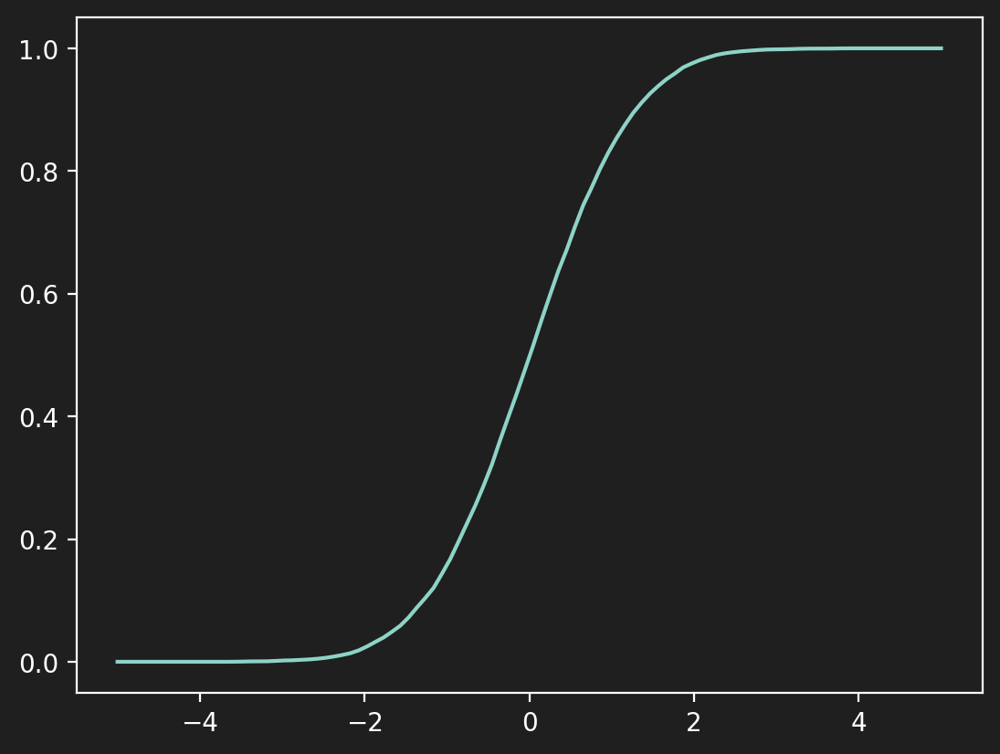

In [ ]:
import tensorflow_probability.substrates.jax as tfp
dist = tfp.distributions.Empirical(samples=sorted(x_data))
x = list(np.linspace(-5, 5, 100))
y = dist.cdf(x)
plt.plot(x, y);


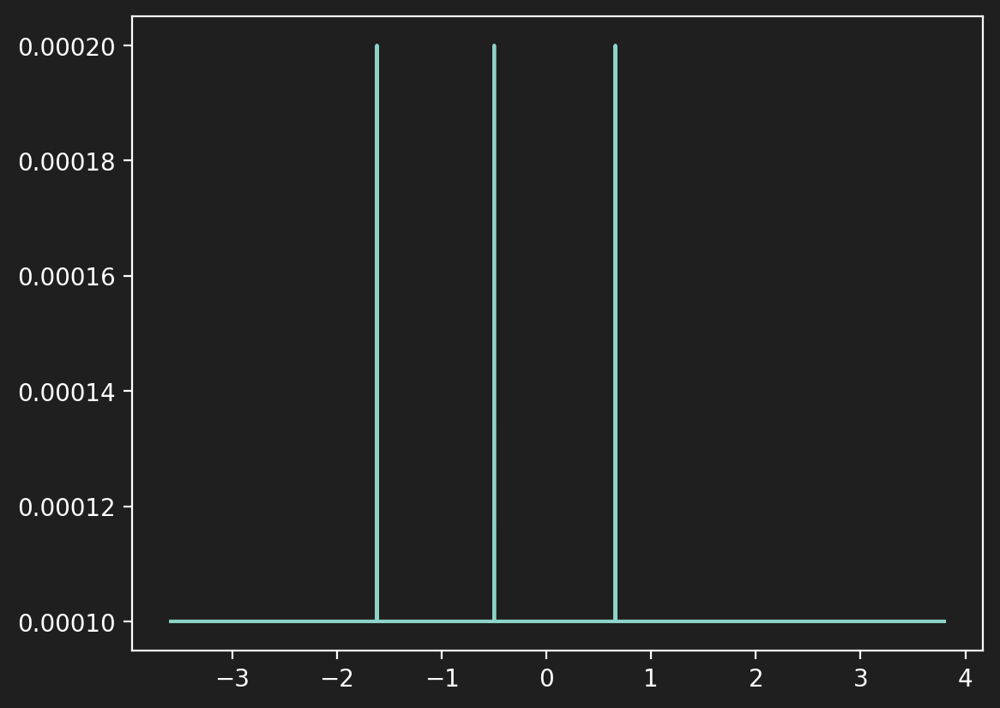

In [ ]:
plt.plot(sorted(x_data), [dist.prob(x) for x in sorted(x_data)])

In [ ]:
#dist = tfp.distributions.Empirical(samples=[0., 1., 1., 2.])
dist.cdf(1.), dist.prob([0., 1.])

(Array(0.8395, dtype=float32), Array([0., 0.], dtype=float32))

In [ ]:
x_data

Array([-2.4424558 , -2.0356805 ,  0.20554423, ..., -0.42662793,
        0.8196244 ,  0.60085636], dtype=float32)

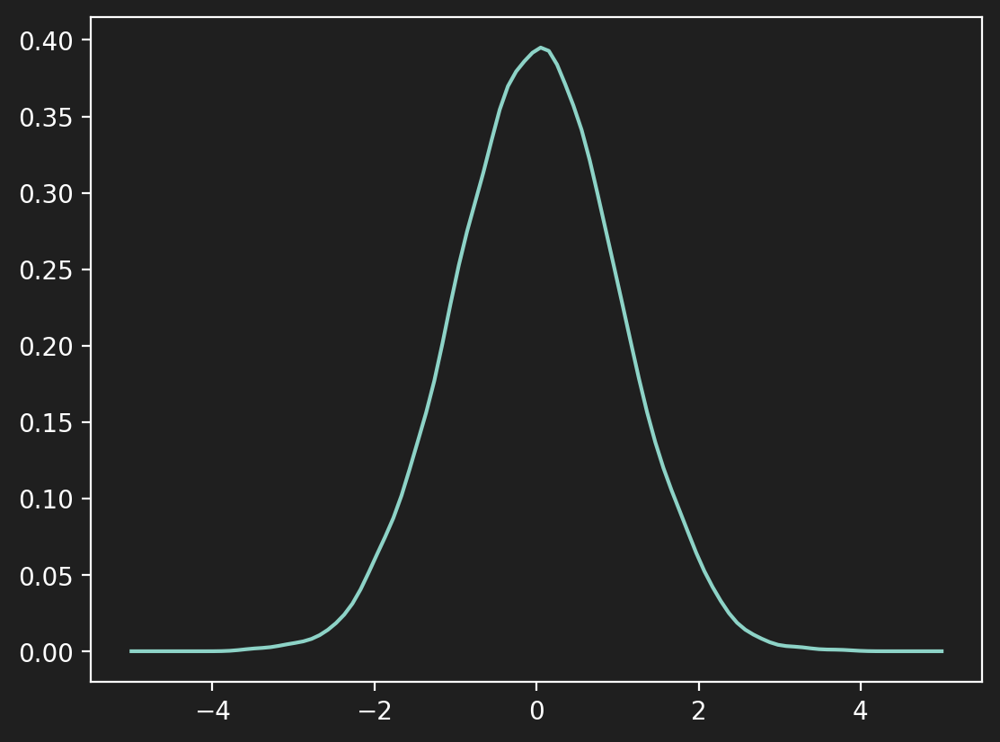

In [ ]:
from scipy import stats
kde = stats.gaussian_kde(x_data)
plt.plot(x, kde(x))

## Moment based inference

In [66]:
import jax
import jax.numpy as jnp
from jax import grad, vmap
import matplotlib.pyplot as plt
import numpy as np

# Set random seed for reproducibility
key = jax.random.PRNGKey(42)

# def compute_sfs_moments(theta):
def compute_sfs_moments(theta):
    """
    Compute the first few moments of the site frequency spectrum
    based on a phase-type distribution parameterized by theta
    
    Args:
        theta: Parameters for the phase-type distribution
              [scaled mutation rate, k shape parameters...]
    
    Returns:
        Array of SFS moments
    """
    # Unpack parameters
    # theta_scaled = theta[0]  # Scaled mutation rate
    # shape_params = theta[1:]  # Phase-type distribution shape parameters

    theta_scaled = 1
    shape_params = theta  

    # This is a simplified example - you would replace this with
    # your actual phase-type distribution moment calculations
    
    # First moment (mean of SFS)
    moment1 = theta_scaled * jnp.sum(1.0 / jnp.arange(1, len(shape_params) + 2))
    
    # Second central moment (variance)
    moment2 = theta_scaled * jnp.sum(shape_params) / jnp.sum(shape_params)**2
    
    # Third central moment (related to skewness)
    moment3 = theta_scaled**2 * jnp.sum(1.0 / jnp.arange(1, len(shape_params) + 2)**2)
    
    return jnp.array([moment1, moment2, moment3])

def moment_based_log_likelihood(theta, target_moments, weight_matrix=None):
    """
    Construct a surrogate log-likelihood based on SFS moment matching
    
    Args:
        theta: Parameters for the phase-type distribution
        target_moments: Observed SFS moments from data
        weight_matrix: Optional weighting for different moments
    
    Returns:
        log-likelihood value (higher is better)
    """
    # Parameter constraints (log transform to ensure positivity)
    theta_positive = jnp.exp(theta)
    
    # Compute model moments based on parameters
    model_moments = compute_sfs_moments(theta_positive)
    
    # Compute moment discrepancy
    moment_diff = model_moments - target_moments
    
    # Apply weighting if provided
    if weight_matrix is not None:
        # Mahalanobis distance with weight matrix
        loss = -jnp.dot(moment_diff, jnp.dot(weight_matrix, moment_diff))
    else:
        # Simple squared error (weighted by magnitude of target moments)
        weights = 1.0 / (jnp.abs(target_moments) + 1e-6)
        loss = -jnp.sum(weights * moment_diff**2)
    
    return loss  # Negative loss serves as log-likelihood

def moment_rbf_kernel(x, y, h=None):
    """RBF kernel with median heuristic for bandwidth"""
    pairwise_dist = jnp.sum((x[:, None, :] - y[None, :, :]) ** 2, axis=-1)
    
    if h is None:
        # Median heuristic for bandwidth selection
        h = jnp.median(pairwise_dist) / jnp.log(x.shape[0] + 1)
        # Prevent h from being too small
        h = jnp.maximum(h, 1e-5)
    
    return jnp.exp(-pairwise_dist / h)

def moment_svgd_update(particles, target_moments, step_size=0.01, h=None, weight_matrix=None):
    """
    SVGD update using moment-based surrogate likelihood
    
    Args:
        particles: Current set of particles (parameter samples)
        target_moments: Observed SFS moments from data
        step_size: Learning rate
        h: Kernel bandwidth (if None, median heuristic is used)
        weight_matrix: Optional weighting for different moments
        
    Returns:
        Updated particles
    """
    def log_p(theta):
        return moment_based_log_likelihood(theta, target_moments, weight_matrix)
    
    # Compute kernel matrix
    K = moment_rbf_kernel(particles, particles, h)
    
    # Compute gradient of log p(x) for all particles
    grad_log_p = vmap(grad(log_p))(particles)
    
    # Compute SVGD update
    kernel_grad = jax.vmap(lambda y: jax.vmap(lambda x: jax.grad(lambda z: moment_rbf_kernel(jnp.expand_dims(z, 0), 
                                                         jnp.expand_dims(y, 0), h)[0, 0])(x))(particles))(particles)
    
    # Compute the final update
    update_direction = (K @ grad_log_p + kernel_grad.sum(axis=0)) / particles.shape[0]
    print(update_direction)
    # Update particles
    updated_particles = particles + step_size * update_direction
    
    return updated_particles




# Example usage with simulated data
# --------------------------------

# Generate synthetic "observed" moments from a known parameter set
# true_params = jnp.array([0.5, 0.3, 0.7, 1.2])  # Example parameters
true_params = jnp.array([1, 1/2 ,1/3, 1/4])  # Example parameters
true_params_positive = jnp.exp(true_params)
target_moments = compute_sfs_moments(true_params_positive)

# Add some noise to make it more realistic
key, subkey = jax.random.split(key)
target_moments = target_moments + 0.05 * jax.random.normal(subkey, shape=target_moments.shape)

print("Target moments:", target_moments)

# Initialize particles randomly
n_particles = 1000
n_params = len(true_params)
key, subkey = jax.random.split(key)
particles = jax.random.normal(subkey, shape=(n_particles, n_params)) 

# Run SVGD for 300 iterations
particle_history = [np.array(particles)]
#step_size = 0.05

# # Define a simple diagonal weight matrix (optional)
# weight_matrix = jnp.diag(1.0 / (jnp.abs(target_moments) + 1e-6))
weight_matrix = None

nr_iterations = 100  # Number of SVGD iterations
for i in range(nr_iterations):
    particles = moment_svgd_update(
        particles, 
        target_moments,
        step_size=step_size,
        weight_matrix=weight_matrix
    )
    
    # Reduce step size over time
    step_size = 0.05 * (1.0 - i/nr_iterations)
    
    every = 1
    if i % every == 0:  # Save every 5 iterations to reduce file size
        particle_history.append(np.array(particles))
        
    # Print progress
    if i % (nr_iterations//5) == 0:
        current_log_lik = jnp.mean(vmap(lambda p: moment_based_log_likelihood(
            p, target_moments, weight_matrix))(particles))
        print(f"Iteration {i}, Log-likelihood: {current_log_lik:.4f}")

# Convert to positive parameters for final estimates
final_particles_positive = jnp.exp(particles)

# Compute means and standard deviations of the approximate posterior
posterior_means = jnp.mean(final_particles_positive, axis=0)
posterior_stds = jnp.std(final_particles_positive, axis=0)

print("\nResults:")
print("True parameters:", jnp.log(true_params_positive))
print("Posterior means:", jnp.log(posterior_means))
print("Posterior stds:", jnp.log(posterior_stds))

# # Visualize results for the first two parameters
# plt.figure(figsize=(10, 8))
# plt.scatter(final_particles_positive[:, 0], final_particles_positive[:, 1], alpha=0.6, s=30)
# plt.scatter(true_params_positive[0], true_params_positive[1], color='red', s=100, marker='*', label='True value')
# plt.xlabel('Scaled Mutation Rate (θ)')
# plt.ylabel('First Shape Parameter')
# plt.title('SVGD Posterior Approximation for Phase-type Distribution')
# plt.legend()
# plt.tight_layout()
# plt.show()

# Create animation of particle evolution
from matplotlib.animation import FuncAnimation

# Convert particles from log space to original space for visualization
positive_particle_history = [np.exp(p) for p in particle_history]


Target moments: [2.3136218 0.1818638 1.4181647]
[[ 9.13256221e-03  4.90888534e-03  9.32060275e-03  5.04003232e-03]
 [-7.33249763e-04 -1.27095322e-04 -2.75032624e-04 -2.75249506e-04]
 [-1.59298186e-04 -1.01547694e-05 -4.60908232e-05 -1.40027332e-05]
 ...
 [ 5.43870497e-04  6.24349399e-04  5.57512511e-04  5.12688770e-04]
 [ 7.52782435e-05 -1.19809505e-04  5.56093655e-05  6.59972866e-05]
 [ 3.80946184e-03  3.40131042e-03  3.87946377e-03  1.05232117e-03]]
Iteration 0, Log-likelihood: -0.0819
[[ 9.1260374e-03  4.9046250e-03  9.3141785e-03  5.0358661e-03]
 [-7.3324615e-04 -1.2709505e-04 -2.7503417e-04 -2.7524939e-04]
 [-1.5929555e-04 -1.0154609e-05 -4.6089866e-05 -1.4002588e-05]
 ...
 [ 5.4372282e-04  6.2422629e-04  5.5739976e-04  5.1258178e-04]
 [ 7.5264041e-05 -1.1983748e-04  5.5598695e-05  6.5982029e-05]
 [ 3.8077263e-03  3.3996780e-03  3.8776454e-03  1.0516474e-03]]
[[ 9.11371317e-03  4.89658117e-03  9.30204429e-03  5.02799870e-03]
 [-7.33235851e-04 -1.27093954e-04 -2.75034050e-04 -2.752

In [53]:
plt.rcParams['animation.embed_limit'] = 100 # Mb

# Create and save animation (skip first couple frames to shrink plotted range)
anim = animate_svgd_2d(positive_particle_history, 
                    #   true_params=[0.0, 1.0],
                    #   obs_stats=[x_data.mean(), x_data.std()],  
                      # labels=["Mean (μ)", "Standard Deviation (σ)"],
                      # title="SVGD Posterior Evolution"
                      )

# Save animation as a gif or mp4
anim.save('svgd_evolution.gif', writer='pillow', fps=10)
# or
# anim.save('svgd_evolution.mp4', writer='ffmpeg', fps=10)

# Display in notebook
from IPython.display import HTML
HTML(anim.to_jshtml())

### From moments

In [31]:
# Calculate empirical moments
empirical_moments = []
for k in range(1, 4):
    moment_k = jnp.mean(x_data**k)
    empirical_moments.append(moment_k)
empirical_moments = jnp.array(empirical_moments)

moments_empirical = moments_empirical(x_data)

print(f"Empirical moments: {empirical_moments}")

# # Calculate theoretical moments for comparison
# theoretical_moments = []
# for k in range(1, 4):
#     moment_k = phase_type_moment(k, alpha_true, T_true)
#     theoretical_moments.append(moment_k)
# theoretical_moments = jnp.array(theoretical_moments)

# print(f"Theoretical moments: {theoretical_moments}")

# Initialize particles for SVGD
n_particles = 3
n_params = 5  # 3 rates + 2 transition probabilities
key, subkey = jax.random.split(key)

# Initialize in the log/logit space
initial_log_rates = jnp.log(jnp.array([0.05, 0.1, 0.15])) + 0.5 * jax.random.normal(subkey, shape=(n_particles, 3))
key, subkey = jax.random.split(key)
initial_logit_probs = jnp.zeros((n_particles, 2)) + 0.5 * jax.random.normal(subkey, shape=(n_particles, 2))

particles = jnp.concatenate([initial_log_rates, initial_logit_probs], axis=1)

# Run SVGD for inference
n_iterations = 500
step_size = 0.02
particle_history = [np.array(particles)]

for i in range(n_iterations):
    particles = moment_svgd_update(particles, empirical_moments, step_size=step_size)

    if i % 50 == 0:
        particle_history.append(np.array(particles))
        print(f"Iteration {i}")

    print(particles)
    assert np.isinf(np.exp(particles[:, :3])).any() == False, "Gradient contains NaN or Inf values"


# Transform final particles back to original parameter space
final_particles = particle_history[-1]
inferred_rates = np.exp(final_particles[:, :3])
inferred_probs = 1.0 / (1.0 + np.exp(-final_particles[:, 3:5]))


Empirical moments: [-0.20960775  1.0810333  -0.678671  ]


TypeError: 'jaxlib.xla_extension.ArrayImpl' object is not callable

/var/folders/s6/srs8qkh52w1_h32d65z95tth0000gn/T/ipykernel_21680/3809877897.py:38: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


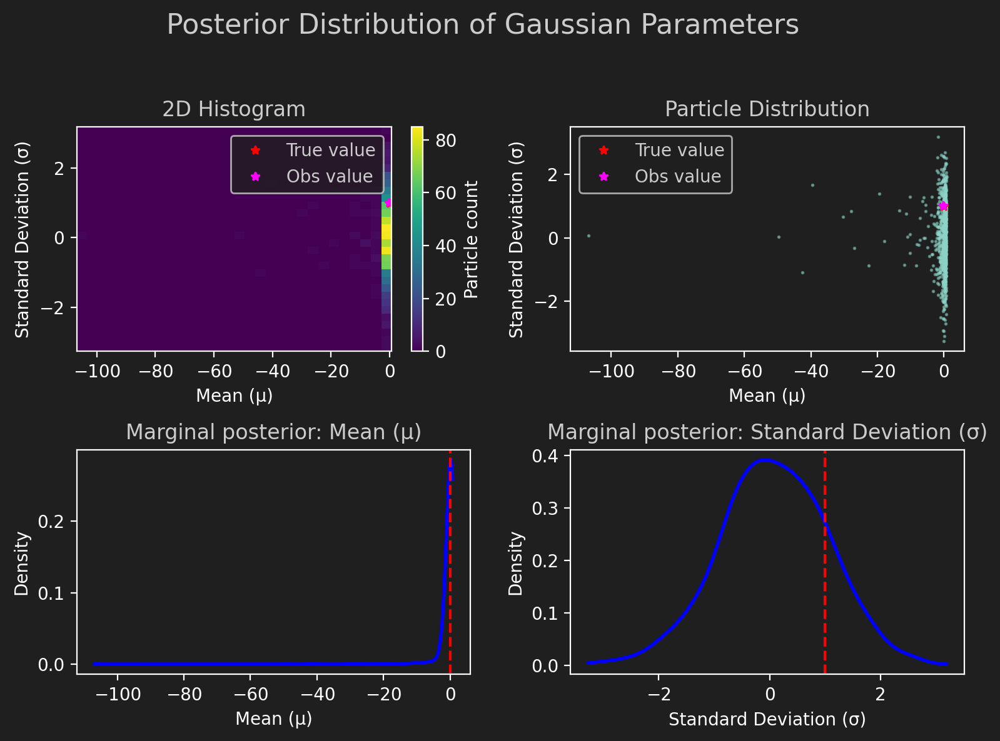

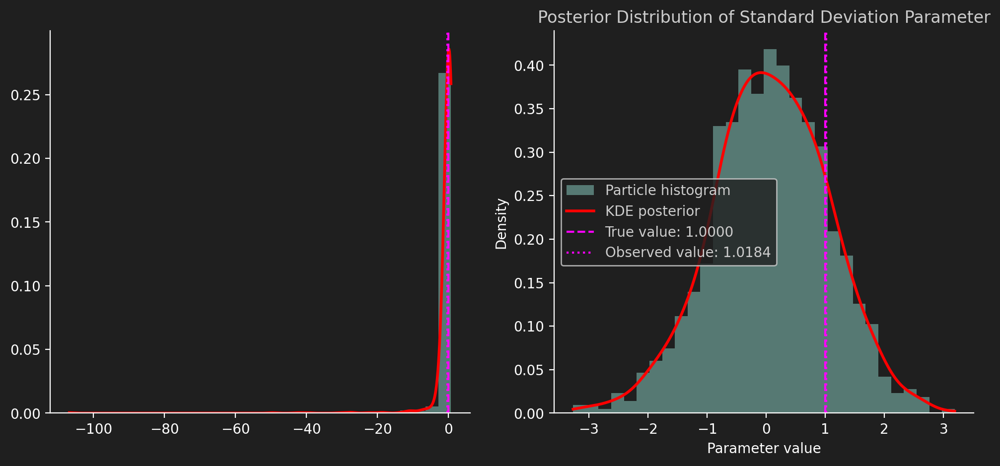

In [22]:
# Assume particles is from our previous example
# with shape (100, 2) where columns are [mean, std_dev]

# Plot the final posterior approximation
plot_svgd_posterior_2d(
    np.array(particles),  # Convert to numpy if using JAX arrays
    true_params=[0.0, 1.0],  # True parameters that generated the data
    obs_stats=[x_data.mean(), x_data.std()],
    labels=["Mean (μ)", "Standard Deviation (σ)"],
    title="Posterior Distribution of Gaussian Parameters"
)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
# You can also plot the marginal for each parameter separately
plot_svgd_posterior_1d(
    particles[:, 0:1],  # Select only the mean parameter
    true_params=mu,
    obs_stats=x_data.mean(),
    ax=ax1,
    title="Posterior Distribution of Mean Parameter"
)

plot_svgd_posterior_1d(
    particles[:, 1:2],  # Select only the std parameter
    true_params=sigma,
    obs_stats=x_data.std(),
    ax=ax2,
    title="Posterior Distribution of Standard Deviation Parameter"
)

In [23]:
plt.rcParams['animation.embed_limit'] = 100 # Mb

# Create and save animation
anim = animate_svgd_2d(particle_history, 
                      true_params=[0.0, 1.0],
                      obs_stats=[x_data.mean(), x_data.std()],  
                      labels=["Mean (μ)", "Standard Deviation (σ)"],
                      title="SVGD Posterior Evolution")

# Save animation as a gif or mp4
anim.save('svgd_evolution.gif', writer='pillow', fps=10)
# or
# anim.save('svgd_evolution.mp4', writer='ffmpeg', fps=10)

# Display in notebook
from IPython.display import HTML
HTML(anim.to_jshtml())


### Example: Phase-Type Distribution for Cell Lineage Analysis

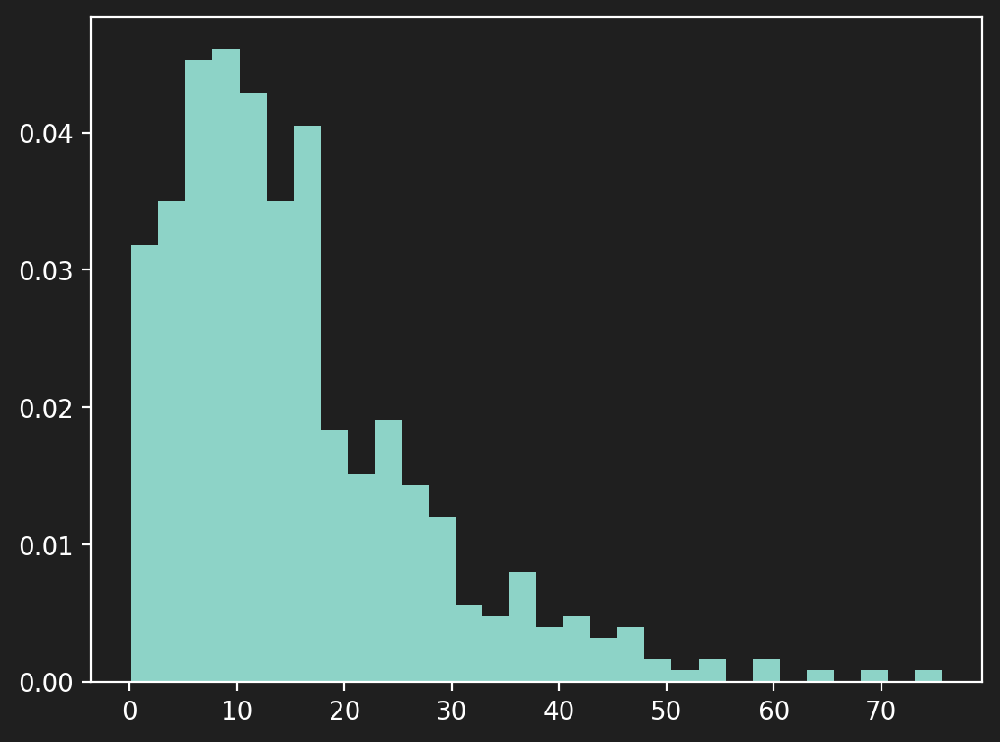

In [24]:
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from jax import grad, vmap
import numpy as np
from scipy.linalg import expm
import math

def phase_type_pdf(t, alpha, T):
    """
    Calculate the PDF of a phase-type distribution.
    
    Args:
        t: Time points to evaluate
        alpha: Initial probability vector (1 x n)
        T: Sub-generator matrix (n x n)
    
    Returns:
        PDF values at time points t
    """
    n = len(alpha)
    exit_vector = -jnp.sum(T, axis=1)  # Column vector of exit rates
    return jnp.array([jnp.dot(alpha, jnp.dot(expm(T * time), exit_vector)) for time in t])

def phase_type_cdf(t, alpha, T):
    """
    Calculate the CDF of a phase-type distribution.
    
    Args:
        t: Time points to evaluate
        alpha: Initial probability vector (1 x n)
        T: Sub-generator matrix (n x n)
    
    Returns:
        CDF values at time points t
    """
    n = len(alpha)
    return jnp.array([1 - jnp.sum(jnp.dot(alpha, expm(T * time))) for time in t])

def phase_type_moment(k, alpha, T):
    """
    Calculate the k-th moment of a phase-type distribution.
    
    Args:
        k: Moment order (1 for mean, 2 for second moment, etc.)
        alpha: Initial probability vector (1 x n)
        T: Sub-generator matrix (n x n)
    
    Returns:
        k-th moment
    """
    n = len(alpha)
    T_inv = jnp.linalg.inv(-T)
    return math.factorial(k) * jnp.dot(alpha, jnp.linalg.matrix_power(T_inv, k))

# Example: Modeling cell lineage dynamics with a Coxian phase-type distribution
def create_coxian_ph(rates, transition_probs):
    """
    Create a Coxian phase-type distribution parameters.
    
    Args:
        rates: Vector of rates for each phase
        transition_probs: Probability of moving to next phase vs. exiting
    
    Returns:
        alpha: Initial probability vector
        T: Sub-generator matrix
    """
    n = len(rates)
    alpha = jnp.zeros(n)
    alpha = alpha.at[0].set(1.0)  # Start in first phase
    
    # Create sub-generator matrix
    T = jnp.zeros((n, n))
    
    # Diagonal elements (negative rates)
    for i in range(n):
        T = T.at[i, i].set(-rates[i])
    
    # Off-diagonal elements (transition rates to next phase)
    for i in range(n-1):
        T = T.at[i, i+1].set(rates[i] * transition_probs[i])
    
    return alpha, T

# Generate a dataset from a known phase-type distribution
def generate_phase_type_samples(alpha, T, n_samples, key):
    """Simulate samples from a phase-type distribution"""
    # For simplicity, using a discrete-time approximation
    # A more accurate approach would use a continuous-time Markov chain simulation
    
    n_phases = len(alpha)
    samples = []
    
    for i in range(n_samples):
        key, subkey = jax.random.split(key)
        
        # Choose initial phase
        key, subkey = jax.random.split(subkey)
        phase = jax.random.choice(subkey, jnp.arange(n_phases), p=alpha)
        
        time = 0.0
        while phase < n_phases:
            key, subkey = jax.random.split(subkey)
            
            # Current phase rate
            rate = -T[phase, phase]
            
            # Generate sojourn time in current phase
            key, subkey = jax.random.split(subkey)
            sojourn = jax.random.exponential(subkey) / rate
            time += sojourn
            
            # Determine next phase or absorption
            exit_prob = 1.0
            for j in range(n_phases):
                if j != phase:
                    exit_prob -= T[phase, j] / rate
            
            key, subkey = jax.random.split(subkey)
            if jax.random.uniform(subkey) < exit_prob:
                # Exit from the system
                phase = n_phases  # Absorbed
            else:
                # Find next phase
                transition_probs = jnp.zeros(n_phases)
                for j in range(n_phases):
                    if j != phase:
                        transition_probs = transition_probs.at[j].set(T[phase, j] / (rate * (1 - exit_prob)))
                
                key, subkey = jax.random.split(subkey)
                phase = jax.random.choice(subkey, jnp.arange(n_phases), p=transition_probs)
        
        samples.append(time)
    
    return jnp.array(samples)

# Now use SVGD to infer parameters using only the moments
def log_likelihood_moment_matching(theta, target_moments):
    """Log-likelihood based on moment matching"""
    # Transform parameters to ensure they're valid
    log_rates = theta[:3]
    logit_probs = theta[3:5]
    
    # Apply transformations
    rates = jnp.exp(log_rates)
    transition_probs = jax.nn.sigmoid(logit_probs)
    
    # Create phase-type distribution
    alpha, T = create_coxian_ph(rates, transition_probs)
    
    # Calculate moments
    model_moments = jnp.array([phase_type_moment(k, alpha, T) for k in range(1, 4)])
    
    # Moment matching loss
    rel_diff = (model_moments - target_moments) / (jnp.abs(target_moments) + 1e-6)
    loss = -jnp.sum(rel_diff**2)
    
    return loss

# Run SVGD with moment matching
def rbf_kernel(x, y, h=None):
    """RBF kernel with median heuristic for bandwidth"""
    pairwise_dist = jnp.sum((x[:, None, :] - y[None, :, :]) ** 2, axis=-1)
    
    if h is None:
        # Median heuristic for bandwidth
        h = jnp.median(pairwise_dist) / jnp.log(x.shape[0] + 1)
        h = jnp.maximum(h, 1e-5)
    
    return jnp.exp(-pairwise_dist / h)

def svgd_update(particles, target_moments, step_size=0.01, h=None):
    """SVGD update step"""
    def log_p(theta):
        return log_likelihood_moment_matching(theta, target_moments)
    
    # Compute kernel matrix
    K = rbf_kernel(particles, particles, h)
    
    # Compute gradient of log p(x) for all particles
    grad_log_p = vmap(grad(log_p))(particles)
    
    # Compute kernel gradient
    grad_K = jax.vmap(lambda y: jax.vmap(lambda x: 
                    jax.grad(lambda z: rbf_kernel(jnp.expand_dims(z, 0),
                                               jnp.expand_dims(y, 0), h)[0, 0])(x))(particles))(particles)
    
    # Compute the update direction
    kernel_grad_sum = jnp.sum(grad_K, axis=0)
    phi = (K @ grad_log_p + kernel_grad_sum) / particles.shape[0]
    print('phi', phi)
    
    # Update particles
    updated_particles = particles + step_size * phi
    
    return updated_particles



# Example: Cell differentiation model with 3 phases
# Phase 1: Stem cell
# Phase 2: Progenitor cell
# Phase 3: Differentiated cell
# Each phase has different rates and probabilities

# True parameters
true_rates = jnp.array([0.1, 0.2, 0.3])  # Rate parameters for each phase
true_transition_probs = jnp.array([0.7, 0.5])  # Probability of moving to next phase vs exiting

# Create true phase-type distribution
alpha_true, T_true = create_coxian_ph(true_rates, true_transition_probs)

# Generate synthetic data
key = jax.random.key(42)
n_samples = 500
samples = generate_phase_type_samples(alpha_true, T_true, n_samples, key)
plt.hist(samples, bins=30, density=True) ;


In [33]:

# Calculate empirical moments
empirical_moments = []
for k in range(1, 4):
    moment_k = jnp.mean(samples**k)
    empirical_moments.append(moment_k)
empirical_moments = jnp.array(empirical_moments)

print(f"Empirical moments: {empirical_moments}")

# Calculate theoretical moments for comparison
theoretical_moments = []
for k in range(1, 4):
    moment_k = phase_type_moment(k, alpha_true, T_true)
    theoretical_moments.append(moment_k)
theoretical_moments = jnp.array(theoretical_moments)

print(f"Theoretical moments: {theoretical_moments}")

# Initialize particles for SVGD
n_particles = 3
n_params = 5  # 3 rates + 2 transition probabilities
key, subkey = jax.random.split(key)

# Initialize in the log/logit space
initial_log_rates = jnp.log(jnp.array([0.05, 0.1, 0.15])) + 0.5 * jax.random.normal(subkey, shape=(n_particles, 3))
key, subkey = jax.random.split(key)
initial_logit_probs = jnp.zeros((n_particles, 2)) + 0.5 * jax.random.normal(subkey, shape=(n_particles, 2))

particles = jnp.concatenate([initial_log_rates, initial_logit_probs], axis=1)

# Run SVGD for inference
n_iterations = 500
step_size = 0.02
particle_history = [np.array(particles)]

for i in range(n_iterations):
    particles = svgd_update(particles, empirical_moments, step_size=step_size)

    if i % 50 == 0:
        particle_history.append(np.array(particles))
        print(f"Iteration {i}")

    print(particles)
    assert np.isinf(np.exp(particles[:, :3])).any() == False, "Gradient contains NaN or Inf values"


# Transform final particles back to original parameter space
final_particles = particle_history[-1]
inferred_rates = np.exp(final_particles[:, :3])
inferred_probs = 1.0 / (1.0 + np.exp(-final_particles[:, 3:5]))

# Plot results
plt.figure(figsize=(15, 5))

# Plot rate parameters
plt.subplot(121)
for i in range(3):
    plt.hist(inferred_rates[:, i], bins=20, alpha=0.5, 
             label=f'Phase {i+1} Rate')
    plt.axvline(true_rates[i], color=f'C{i}', linestyle='--', 
                label=f'True Rate {i+1}')

plt.title('Inferred Rate Parameters')
plt.xlabel('Rate')
plt.ylabel('Count')
plt.legend()

# Plot transition probabilities
plt.subplot(122)
for i in range(2):
    plt.hist(inferred_probs[:, i], bins=20, alpha=0.5, 
             label=f'Transition Prob {i+1}')
    plt.axvline(true_transition_probs[i], color=f'C{i+3}', linestyle='--', 
                label=f'True Prob {i+1}')

plt.title('Inferred Transition Probabilities')
plt.xlabel('Probability')
plt.ylabel('Count')
plt.legend()

plt.tight_layout()
plt.show()

# Calculate mean parameter estimates
mean_rates = np.mean(inferred_rates, axis=0)
mean_probs = np.mean(inferred_probs, axis=0)

print("True parameters:")
print(f"Rates: {true_rates}")
print(f"Transition probs: {true_transition_probs}")
print("\nInferred parameters (mean):")
print(f"Rates: {mean_rates}")
print(f"Transition probs: {mean_probs}")

# Visualize the true vs. inferred distribution
inferred_alpha, inferred_T = create_coxian_ph(mean_rates, mean_probs)

t = np.linspace(0, 50, 1000)
true_pdf = phase_type_pdf(t, alpha_true, T_true)
inferred_pdf = phase_type_pdf(t, inferred_alpha, inferred_T)

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.hist(samples, bins=30, density=True, alpha=0.5, label='Data')
plt.plot(t, true_pdf, 'r-', label='True PDF')
plt.plot(t, inferred_pdf, 'g--', label='Inferred PDF')
plt.title('Phase-Type Distribution: True vs. Inferred')
plt.xlabel('Time')
plt.ylabel('Density')
plt.legend()

plt.subplot(122)
true_cdf = phase_type_cdf(t, alpha_true, T_true)
inferred_cdf = phase_type_cdf(t, inferred_alpha, inferred_T)
plt.plot(t, true_cdf, 'r-', label='True CDF')
plt.plot(t, inferred_cdf, 'g--', label='Inferred CDF')
plt.title('CDF: True vs. Inferred')
plt.xlabel('Time')
plt.ylabel('Cumulative Probability')
plt.legend()

plt.tight_layout()
plt.show()


Empirical moments: [   15.514154   384.4733   13011.899   ]
Theoretical moments: [[1.0000000e+01 3.5000000e+00 1.1666667e+00]
 [2.0000000e+02 1.0500000e+02 4.2777782e+01]
 [6.0000000e+03 3.6750000e+03 1.6527778e+03]]
phi [[ 1.2365147e+09  2.1022346e+03 -1.2118166e-01 -1.2615045e+03
   5.9655253e-02]
 [ 1.8835016e+07  8.2836982e+03  1.5477742e-01 -1.1114874e+03
  -5.4266308e-02]
 [ 2.3896486e+08  3.4029678e+03  2.6986012e-01 -8.5935620e+02
  -9.5906675e-02]]
Iteration 0
[[ 2.4730290e+07  4.0129536e+01 -1.1292970e+00 -2.6381222e+01
   2.7582092e-02]
 [ 3.7669825e+05  1.6293991e+02 -2.2975326e+00 -2.1387463e+01
  -2.1074708e-01]
 [ 4.7792940e+06  6.6148506e+01 -2.3847094e+00 -1.7224846e+01
  -2.1431492e-01]]


/var/folders/s6/srs8qkh52w1_h32d65z95tth0000gn/T/ipykernel_21680/3903112404.py:44: RuntimeWarning: overflow encountered in exp
  assert np.isinf(np.exp(particles[:, :3])).any() == False, "Gradient contains NaN or Inf values"


AssertionError: Gradient contains NaN or Inf values

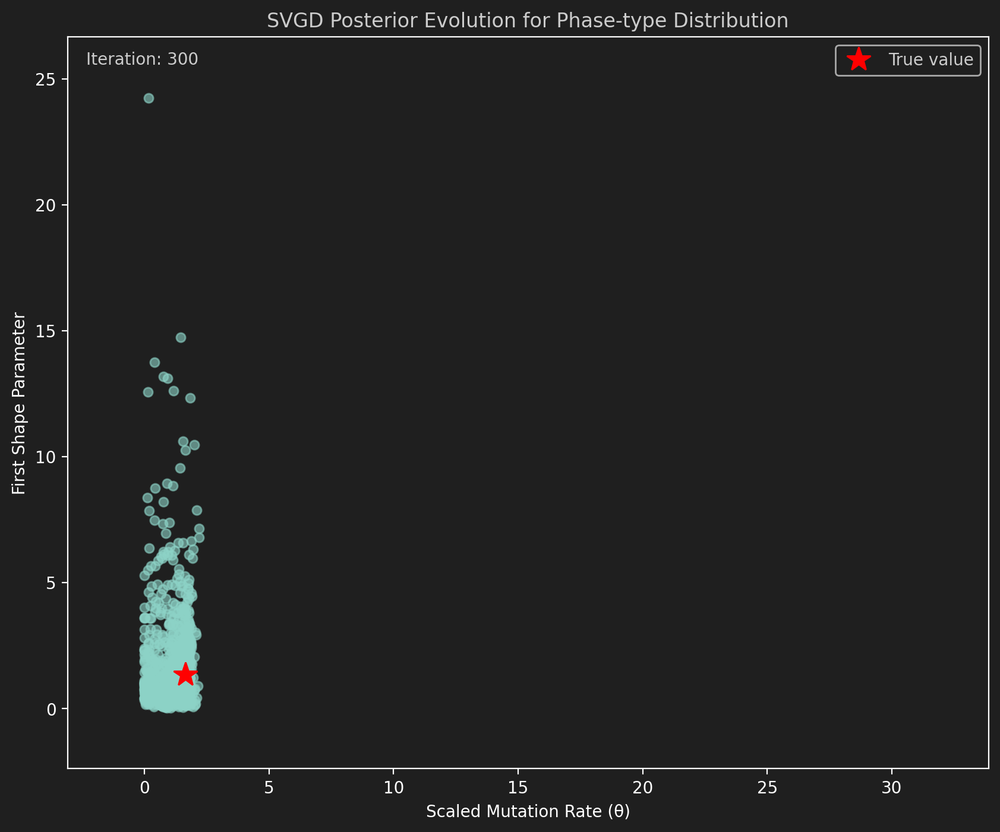

In [11]:

# Create animation
anim = animate_svgd_2d(positive_particle_history, 
                      true_params=true_params_positive[:2],
                      labels=["Scaled Mutation Rate (θ)", "First Shape Parameter"],
                      title="SVGD Posterior Evolution for Phase-type Distribution")

# To display in notebook
from IPython.display import HTML
HTML(anim.to_jshtml())

# To save animation
# anim.save('phase_type_svgd.gif', writer='pillow', fps=5)
